In [2]:
import requests
from bs4 import BeautifulSoup as bs
from IPython.core.display import HTML
import pandas as pd
import re

In [3]:
URL = 'https://www.ea.com/games/ea-sports-fc/ratings?page=1'

response = requests.get(URL)
response.status_code

200

In [4]:
response.text ##call URL html and show as text
soup = bs(response.text) ##soupify response
print(soup.prettify()) ##print in a more readable form

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[<a class="UnstyledButton_unstyled__A5fSP" href="https://ea.com"><svg aria-label="https://ea.com" color="var(--network-nav-icon-fill)" fill="none" height="12" viewbox="0 0 93 12" width="93" xmlns="http://www.w3.org/2000/svg"><g clip-path="url(#ElectronicArtsWordmark_svg__a)" fill="currentColor"><path d="M0 11.354h7.45V9.578H2.054V7.07h4.37V5.296h-4.37V2.89H7.45V1.086H0v10.268ZM8.297 11.354h1.864V.5l-1.864.586v10.268ZM14.784 3.874c-2.098 0-3.798 1.598-3.798 3.813 0 2.216 1.788 3.813 3.988 3.813 1.628 0 2.948-.924 3.506-2.332h-2.068c-.308.455-.836.675-1.408.675-.998 0-1.818-.616-2.068-1.54h5.646c0-.103.016-.191.016-.279 0-2.816-1.996-4.15-3.814-4.15ZM12.95 6.968c.25-.894.968-1.466 1.834-1.466a1.81 1.81 0 0 1 1.79 1.466H12.95ZM23.053 5.62a1.903 1.903 0 0 1 1.804 1.29h1.892a3.732 3.732 0 0 0-3.696-3.022c-2.112 0-3.828 1.6-3.828 3.814S20.94 11.5 23.053 11.5c1.818 0 3.344-1.188 3.696-2.962h-1.892a1.903 1.903 0 0 1-1.804 1.29c-1.1 0-1.98-.865-1.98-2.097 0-1.261.88-2.112 1.98-2.112ZM29.179 1.8
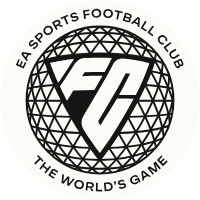

In [5]:
soup.findAll('a')

<table class="Table_table__dpnEU" role="table"><thead class="Table_thead__0dzYk"><tr class="Table_row__4INyY"><th class="Table_headingCell__D1nZb generated_utility17__YNcLk" scope="col"><button class="Table_tooltipTrigger__HIIPW" data-state="closed">Rank</button></th><th class="Table_headingCell__D1nZb generated_utility17__YNcLk" scope="col"><button class="Table_tooltipTrigger__HIIPW" data-state="closed">PLAYER</button></th><th class="Table_headingCell__D1nZb generated_utility17__YNcLk" scope="col"><button class="Table_tooltipTrigger__HIIPW" data-state="closed">NAT</button></th><th class="Table_headingCell__D1nZb generated_utility17__YNcLk" scope="col"><button class="Table_tooltipTrigger__HIIPW" data-state="closed">TEAM</button></th><th class="Table_headingCell__D1nZb generated_utility17__YNcLk" scope="col"><button class="Table_tooltipTrigger__HIIPW" data-state="closed">POS</button></th><th class="Table_headingCell__D1nZb generated_utility17__YNcLk" scope="col"><button class="Table_too
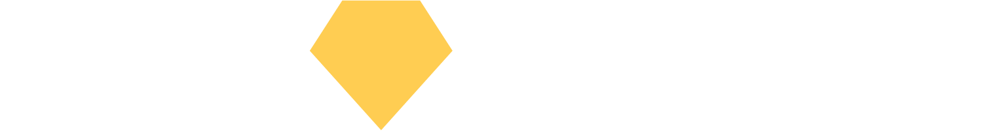
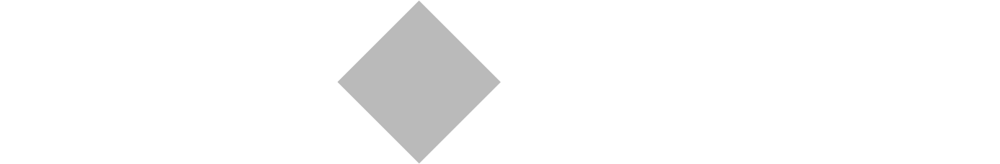
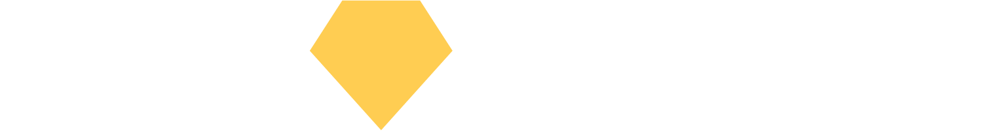
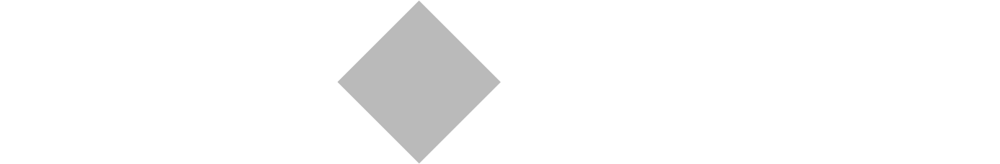
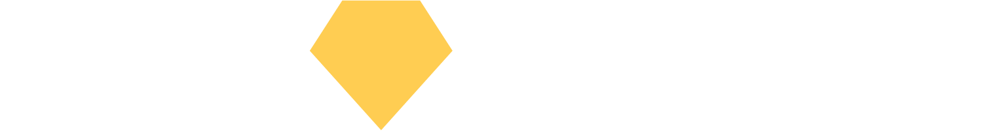
...
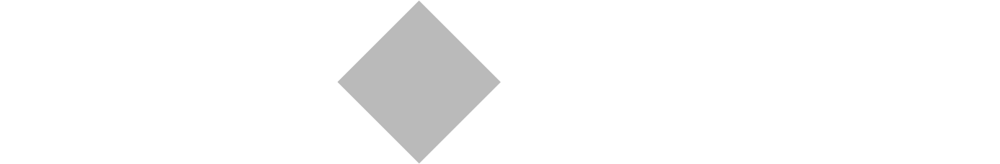
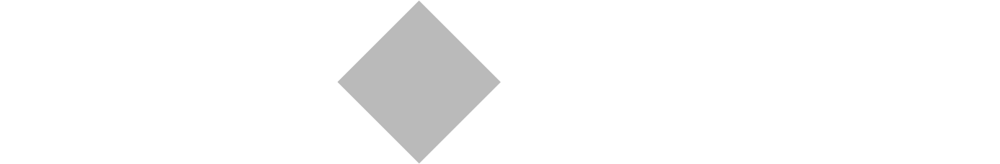
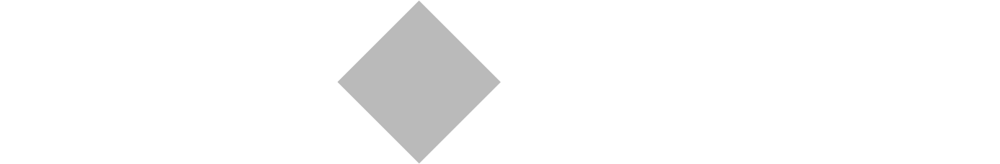
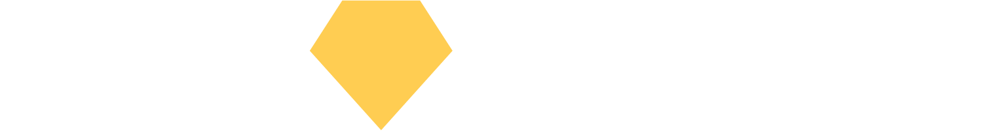
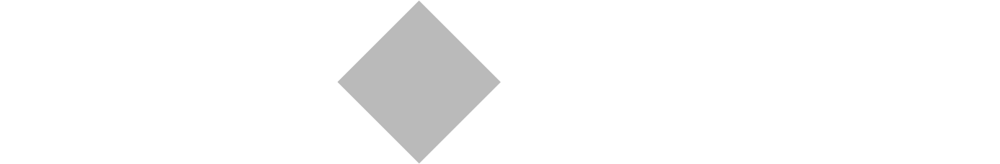

In [6]:
soup.find('table', attrs={'class':'Table_table__dpnEU'})


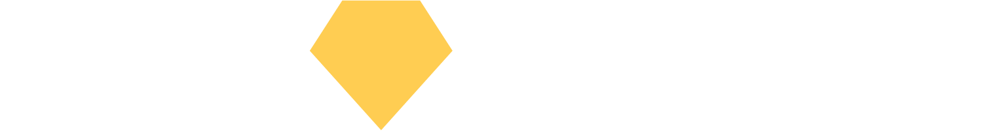
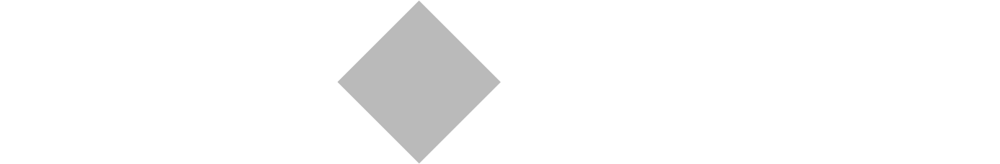
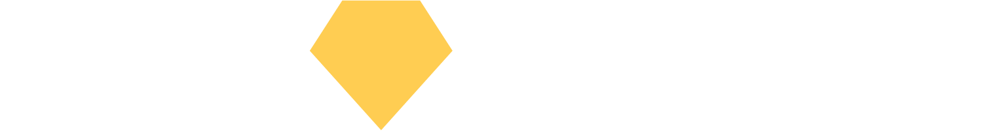
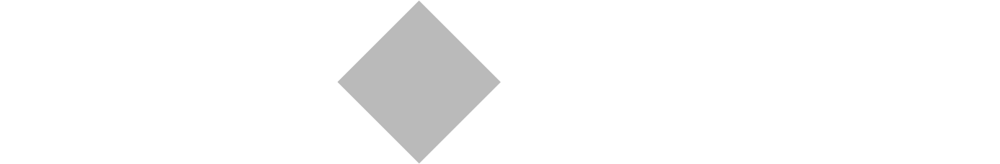
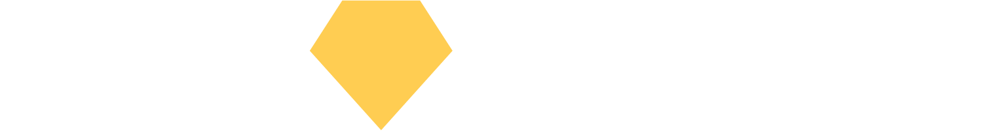
...
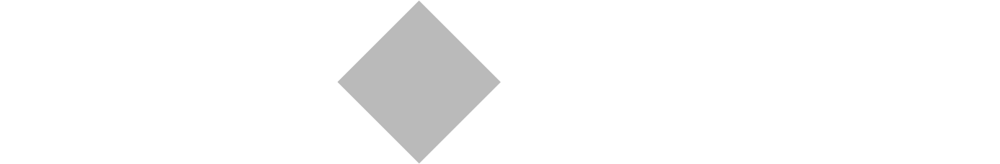
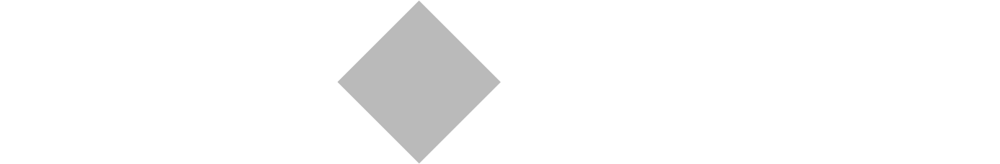
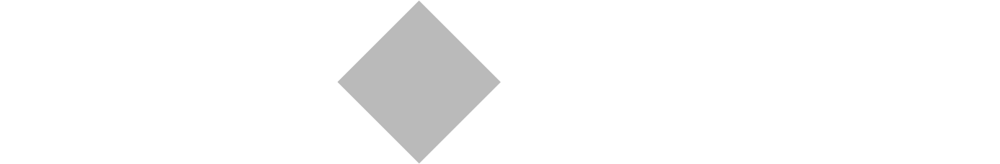
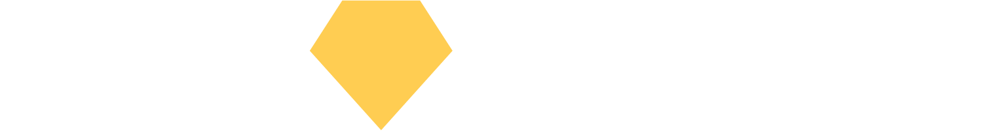
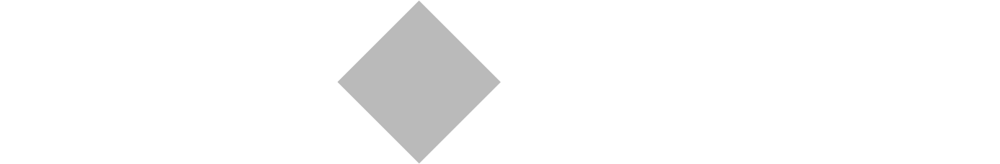

In [7]:
table_html = str(soup.find('table', attrs={'class':'Table_table__dpnEU'}))

HTML(table_html)

In [10]:
player_stats_1 = pd.read_html(str(soup.find('table', attrs={'class':'Table_table__dpnEU'})))[0]
player_stats_1

,Rank,PLAYER,NAT,TEAM,POS,Overall,PAC,SHO,PAS,DRI,DEF,PHY,Unnamed: 12,Unnamed: 13
0,1,Kylian MbappéST,NaN,NaN,ST,Overall91,PAC97,SHO901,PAS80,DRI92,DEF36,PHY782,NaN,Overall91PAC97SHO901PAS80DRI92DEF36PHY782
1,Overall91,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,PAC97,SHO901,PAS80,DRI92,DEF36,PHY782,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,NaN
4,2,Alexia PutellasCM,NaN,NaN,CM,Overall91,PAC82,SHO90,PAS91,DRI92,DEF72,PHY78,NaN,Overall91PAC82SHO90PAS91DRI92DEF72PHY78
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,NaN
396,100,Jack GrealishLW,NaN,NaN,LW,Overall85,PAC76,SHO76,PAS841,DRI881,DEF537,PHY734,NaN,Overall85PAC76SHO76PAS841DRI881DEF537PHY734
397,Overall85,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
398,PAC76,SHO76,PAS841,DRI881,DEF537,PHY734,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:

valid_row_interval = 4  # Change this based on your observation
first_valid_row_index = 0  # Or change this if the first valid row isn't the first row

# Filter rows: Keep a row if it's index modulo valid_row_interval equals first_valid_row_index
player_stats_cleaned = player_stats_1.iloc[(player_stats_1.index - first_valid_row_index) % valid_row_interval == 0].reset_index(drop=True)


In [9]:
player_stats_cleaned

,Rank,PLAYER,NAT,TEAM,POS,Overall,PAC,SHO,PAS,DRI,DEF,PHY,Unnamed: 12,Unnamed: 13
0,1,Kylian MbappéST,NaN,NaN,ST,Overall91,PAC97,SHO901,PAS80,DRI92,DEF36,PHY782,NaN,Overall91PAC97SHO901PAS80DRI92DEF36PHY782
1,2,Alexia PutellasCM,NaN,NaN,CM,Overall91,PAC82,SHO90,PAS91,DRI92,DEF72,PHY78,NaN,Overall91PAC82SHO90PAS91DRI92DEF72PHY78
2,3,Erling HaalandST,NaN,NaN,ST,Overall91,PAC89,SHO932,PAS661,DRI80,DEF454,PHY881,NaN,Overall91PAC89SHO932PAS661DRI80DEF454PHY881
3,4,Kevin De BruyneCM,NaN,NaN,CM,Overall91,PAC722,SHO88,PAS941,DRI87,DEF651,PHY781,NaN,Overall91PAC722SHO88PAS941DRI87DEF651PHY781
4,5,Aitana BonmatíCM,NaN,NaN,CM,Overall90,PAC81,SHO84,PAS83,DRI91,DEF75,PHY73,NaN,Overall90PAC81SHO84PAS83DRI91DEF75PHY73
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,Ashley LawrenceRB,NaN,NaN,RB,Overall86,PAC86,SHO67,PAS82,DRI80,DEF82,PHY78,NaN,Overall86PAC86SHO67PAS82DRI80DEF82PHY78
96,97,Mallory SwansonLW,NaN,NaN,LW,Overall86,PAC93,SHO82,PAS82,DRI84,DEF42,PHY71,NaN,Overall86PAC93SHO82PAS82DRI84DEF42PHY71
97,98,Wojciech SzczęsnyGK,NaN,NaN,GK,Overall86,PAC86,SHO832,PAS73,DRI87,DEF49,PHY86,NaN,Overall86PAC86SHO832PAS73DRI87DEF49PHY86
98,99,Cristiana GirelliST,NaN,NaN,ST,Overall86,PAC81,SHO85,PAS71,DRI81,DEF46,PHY78,NaN,Overall86PAC81SHO85PAS71DRI81DEF46PHY78


In [10]:
base_url = "https://www.ea.com/games/ea-sports-fc/ratings?page="
start_page = 1
end_page = 174

In [11]:
base_url = "https://www.ea.com/games/ea-sports-fc/ratings?page="
start_page = 1
end_page = 174

#initialize empty DF
all_player_stats = []

for page in range(start_page, end_page + 1):
    url = f"{base_url}{page}"
    response = requests.get(url)
    print(page)
    print(url)
    
    if response.status_code == 200:
        soup = bs(response.content, 'html.parser')
        
        # Use your existing logic to scrape the table
        # Note: read_html returns a list of DataFrames. Assuming you want the first table, use [0] to get it.
        current_page_stats = pd.read_html(str(soup.find('table', attrs={'class':'Table_table__dpnEU'})))[0]
        
        # Append the current page's DataFrame to the list
        all_player_stats.append(current_page_stats)
    else:
        print(f"Failed to retrieve page {page}")
        
# Concatenate all DataFrames in the list into a single DataFrame
final_player_stats_df = pd.concat(all_player_stats, ignore_index=True)

1
https://www.ea.com/games/ea-sports-fc/ratings?page=1
2
https://www.ea.com/games/ea-sports-fc/ratings?page=2
3
https://www.ea.com/games/ea-sports-fc/ratings?page=3
4
https://www.ea.com/games/ea-sports-fc/ratings?page=4
5
https://www.ea.com/games/ea-sports-fc/ratings?page=5
6
https://www.ea.com/games/ea-sports-fc/ratings?page=6
7
https://www.ea.com/games/ea-sports-fc/ratings?page=7
8
https://www.ea.com/games/ea-sports-fc/ratings?page=8
9
https://www.ea.com/games/ea-sports-fc/ratings?page=9
10
https://www.ea.com/games/ea-sports-fc/ratings?page=10
11
https://www.ea.com/games/ea-sports-fc/ratings?page=11
12
https://www.ea.com/games/ea-sports-fc/ratings?page=12
13
https://www.ea.com/games/ea-sports-fc/ratings?page=13
14
https://www.ea.com/games/ea-sports-fc/ratings?page=14
15
https://www.ea.com/games/ea-sports-fc/ratings?page=15
16
https://www.ea.com/games/ea-sports-fc/ratings?page=16
17
https://www.ea.com/games/ea-sports-fc/ratings?page=17
18
https://www.ea.com/games/ea-sports-fc/ratings?

144
https://www.ea.com/games/ea-sports-fc/ratings?page=144
145
https://www.ea.com/games/ea-sports-fc/ratings?page=145
146
https://www.ea.com/games/ea-sports-fc/ratings?page=146
147
https://www.ea.com/games/ea-sports-fc/ratings?page=147
148
https://www.ea.com/games/ea-sports-fc/ratings?page=148
149
https://www.ea.com/games/ea-sports-fc/ratings?page=149
150
https://www.ea.com/games/ea-sports-fc/ratings?page=150
151
https://www.ea.com/games/ea-sports-fc/ratings?page=151
152
https://www.ea.com/games/ea-sports-fc/ratings?page=152
153
https://www.ea.com/games/ea-sports-fc/ratings?page=153
154
https://www.ea.com/games/ea-sports-fc/ratings?page=154
155
https://www.ea.com/games/ea-sports-fc/ratings?page=155
156
https://www.ea.com/games/ea-sports-fc/ratings?page=156
157
https://www.ea.com/games/ea-sports-fc/ratings?page=157
158
https://www.ea.com/games/ea-sports-fc/ratings?page=158
159
https://www.ea.com/games/ea-sports-fc/ratings?page=159
160
https://www.ea.com/games/ea-sports-fc/ratings?page=1

In [12]:
final_player_stats_df

,Rank,PLAYER,NAT,TEAM,POS,Overall,PAC,SHO,PAS,DRI,DEF,PHY,Unnamed: 12,Unnamed: 13
0,1,Kylian MbappéST,NaN,NaN,ST,Overall91,PAC97,SHO901,PAS80,DRI92,DEF36,PHY782,NaN,Overall91PAC97SHO901PAS80DRI92DEF36PHY782
1,Overall91,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,PAC97,SHO901,PAS80,DRI92,DEF36,PHY782,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,WEAK FOOTSKILL MOVESATT WORK RATEHighDEF WORK ...,NaN
4,2,Alexia PutellasCM,NaN,NaN,CM,Overall91,PAC82,SHO90,PAS91,DRI92,DEF72,PHY78,NaN,Overall91PAC82SHO90PAS91DRI92DEF72PHY78
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69299,WEAK FOOTSKILL MOVESATT WORK RATEMediumDEF WOR...,WEAK FOOTSKILL MOVESATT WORK RATEMediumDEF WOR...,WEAK FOOTSKILL MOVESATT WORK RATEMediumDEF WOR...,WEAK FOOTSKILL MOVESATT WORK RATEMediumDEF WOR...,WEAK FOOTSKILL MOVESATT WORK RATEMediumDEF WOR...,WEAK FOOTSKILL MOVESATT WORK RATEMediumDEF WOR...,WEAK FOOTSKILL MOVESATT WORK RATEMediumDEF WOR...,WEAK FOOTSKILL MOVESATT WORK RATEMediumDEF WOR...,WEAK FOOTSKILL MOVESATT WORK RATEMediumDEF WOR...,WEAK FOOTSKILL MOVESATT WORK RATEMediumDEF WOR...,WEAK FOOTSKILL MOVESATT WORK RATEMediumDEF WOR...,WEAK FOOTSKILL MOVESATT WORK RATEMediumDEF WOR...,WEAK FOOTSKILL MOVESATT WORK RATEMediumDEF WOR...,NaN
69300,17318,Yin JieCM,NaN,NaN,CM,Overall47,PAC57,SHO37,PAS46,DRI46,DEF38,PHY57,NaN,Overall47PAC57SHO37PAS46DRI46DEF38PHY57
69301,Overall47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
69302,PAC57,SHO37,PAS46,DRI46,DEF38,PHY57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
valid_row_interval = 4  
first_valid_row_index = 0

# Filter rows: Keep a row if it's index modulo valid_row_interval equals first_valid_row_index
player_stats_cleaned = final_player_stats_df.iloc[(final_player_stats_df.index - first_valid_row_index) % valid_row_interval == 0].reset_index(drop=True)


In [14]:
player_stats_cleaned

,Rank,PLAYER,NAT,TEAM,POS,Overall,PAC,SHO,PAS,DRI,DEF,PHY,Unnamed: 12,Unnamed: 13
0,1,Kylian MbappéST,NaN,NaN,ST,Overall91,PAC97,SHO901,PAS80,DRI92,DEF36,PHY782,NaN,Overall91PAC97SHO901PAS80DRI92DEF36PHY782
1,2,Alexia PutellasCM,NaN,NaN,CM,Overall91,PAC82,SHO90,PAS91,DRI92,DEF72,PHY78,NaN,Overall91PAC82SHO90PAS91DRI92DEF72PHY78
2,3,Erling HaalandST,NaN,NaN,ST,Overall91,PAC89,SHO932,PAS661,DRI80,DEF454,PHY881,NaN,Overall91PAC89SHO932PAS661DRI80DEF454PHY881
3,4,Kevin De BruyneCM,NaN,NaN,CM,Overall91,PAC722,SHO88,PAS941,DRI87,DEF651,PHY781,NaN,Overall91PAC722SHO88PAS941DRI87DEF651PHY781
4,5,Aitana BonmatíCM,NaN,NaN,CM,Overall90,PAC81,SHO84,PAS83,DRI91,DEF75,PHY73,NaN,Overall90PAC81SHO84PAS83DRI91DEF75PHY73
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17321,17318,Deven SawhneyLB,NaN,NaN,LB,Overall47,PAC62,SHO26,PAS34,DRI42,DEF43,PHY57,NaN,Overall47PAC62SHO26PAS34DRI42DEF43PHY57
17322,17318,Wang TengdaCM,NaN,NaN,CM,Overall47,PAC61,SHO37,PAS45,DRI48,DEF43,PHY47,NaN,Overall47PAC61SHO37PAS45DRI48DEF43PHY47
17323,17318,Wu YuhangCDM,NaN,NaN,CDM,Overall47,PAC56,SHO34,PAS43,DRI45,DEF43,PHY51,NaN,Overall47PAC56SHO34PAS43DRI45DEF43PHY51
17324,17318,Ye DaoxinCB,NaN,NaN,CB,Overall47,PAC58,SHO28,PAS33,DRI39,DEF49,PHY48,NaN,Overall47PAC58SHO28PAS33DRI39DEF49PHY48


In [85]:
player_stats_cleaned['PLAYER'] = player_stats_cleaned['PLAYER'].str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('utf-8')
player_stats_cleaned.head(2)

,Rank,PLAYER,NAT,TEAM,POS,Overall,PAC,SHO,PAS,DRI,...,SHO_cleaned,SHO_position,PAS_cleaned,PAS_position,DRI_cleaned,DRI_position,DEF_cleaned,DEF_position,PHY_cleaned,PHY_position
0,1,Kylian Mbappe,NaN,NaN,ST,Overall91,PAC97,SHO901,PAS80,DRI92,...,901,None,80,None,92,None,36,None,782,None
1,2,Alexia Putellas,NaN,NaN,CM,Overall91,PAC82,SHO90,PAS91,DRI92,...,90,None,91,None,92,None,72,None,78,None


In [86]:
def parse_name(input_str):
    # This regex looks for the last occurrence of a lowercase letter followed by an uppercase letter,
    # which commonly indicates the separation point between name and position
    match = re.search(r'([a-z])([A-Z])', input_str)
    if match:
        split_index = match.start(2)
        name = input_str[:split_index].strip()
        position = input_str[split_index:].strip()
        return name
    else:
        cleaned_str = re.sub(r'\D', '', input_str)
        return cleaned_str, None

In [87]:
columns_to_clean = ['Overall', 'PAC', 'SHO', 'PAS', 'DRI', 'DEF', 'PHY']

for column in columns_to_clean:
    player_stats_cleaned[[f'{column}_cleaned', f'{column}_position']] = player_stats_cleaned[column].apply(lambda x: parse_name(x)).apply(pd.Series)

In [88]:
players_clean = player_stats_cleaned.drop(columns = columns_to_clean)

to_delete = [f'{column}_position' for column in columns_to_clean]
players_clean = players_clean.drop(columns = to_delete)

players_clean

,Rank,PLAYER,NAT,TEAM,POS,Unnamed: 12,Unnamed: 13,POSITION,Overall_cleaned,PAC_cleaned,SHO_cleaned,PAS_cleaned,DRI_cleaned,DEF_cleaned,PHY_cleaned
0,1,Kylian Mbappe,NaN,NaN,ST,NaN,Overall91PAC97SHO901PAS80DRI92DEF36PHY782,NaN,91,97,901,80,92,36,782
1,2,Alexia Putellas,NaN,NaN,CM,NaN,Overall91PAC82SHO90PAS91DRI92DEF72PHY78,NaN,91,82,90,91,92,72,78
2,3,Erling Haaland,NaN,NaN,ST,NaN,Overall91PAC89SHO932PAS661DRI80DEF454PHY881,NaN,91,89,932,661,80,454,881
3,4,Kevin De Bruyne,NaN,NaN,CM,NaN,Overall91PAC722SHO88PAS941DRI87DEF651PHY781,NaN,91,722,88,941,87,651,781
4,5,Aitana Bonmati,NaN,NaN,CM,NaN,Overall90PAC81SHO84PAS83DRI91DEF75PHY73,NaN,90,81,84,83,91,75,73
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17321,17318,Deven Sawhney,NaN,NaN,LB,NaN,Overall47PAC62SHO26PAS34DRI42DEF43PHY57,NaN,47,62,26,34,42,43,57
17322,17318,Wang Tengda,NaN,NaN,CM,NaN,Overall47PAC61SHO37PAS45DRI48DEF43PHY47,NaN,47,61,37,45,48,43,47
17323,17318,Wu Yuhang,NaN,NaN,CDM,NaN,Overall47PAC56SHO34PAS43DRI45DEF43PHY51,NaN,47,56,34,43,45,43,51
17324,17318,Ye Daoxin,NaN,NaN,CB,NaN,Overall47PAC58SHO28PAS33DRI39DEF49PHY48,NaN,47,58,28,33,39,49,48


In [89]:
to_delete = ['Unnamed: 12', 'Unnamed: 13', 'POSITION']
players_clean = players_clean.drop(columns = to_delete)

players_clean.head(2)

,Rank,PLAYER,NAT,TEAM,POS,Overall_cleaned,PAC_cleaned,SHO_cleaned,PAS_cleaned,DRI_cleaned,DEF_cleaned,PHY_cleaned
0,1,Kylian Mbappe,NaN,NaN,ST,91,97,901,80,92,36,782
1,2,Alexia Putellas,NaN,NaN,CM,91,82,90,91,92,72,78


In [90]:
rename = {'Rank':'rank',
          'PLAYER':'player_name',
          'NAT':'nationality',
          'TEAM':'team',
          'POS':'position',
          'Overall_cleaned':'overall_rating',
          'PAC_cleaned':'pace',
          'SHO_cleaned':'shooting',
          'PAS_cleaned':'passing',
          'DRI_cleaned':'dribbling',
          'DEF_cleaned':'defense',
          'PHY_cleaned':'physical'}

players_clean.rename(columns = rename, inplace = 'true')

players_clean.head()

,rank,player_name,nationality,team,position,overall_rating,pace,shooting,passing,dribbling,defense,physical
0,1,Kylian Mbappe,NaN,NaN,ST,91,97,901,80,92,36,782
1,2,Alexia Putellas,NaN,NaN,CM,91,82,90,91,92,72,78
2,3,Erling Haaland,NaN,NaN,ST,91,89,932,661,80,454,881
3,4,Kevin De Bruyne,NaN,NaN,CM,91,722,88,941,87,651,781
4,5,Aitana Bonmati,NaN,NaN,CM,90,81,84,83,91,75,73


In [92]:
players_clean[['overall_rating', 'pace', 'shooting', 'passing', 'dribbling', 'defense', 'physical']] = players_clean[['overall_rating', 'pace', 'shooting', 'passing', 'dribbling', 'defense', 'physical']].apply(pd.to_numeric)
players_clean.dtypes

rank              object
player_name       object
nationality       object
team              object
position          object
overall_rating     int64
pace               int64
shooting           int64
passing            int64
dribbling          int64
defense            int64
physical           int64
dtype: object

In [93]:
def trim_digits(val):
    #convert value to string, in case it isn't already
    val_str = str(val)
    #if the value has more than 2 digits, trim it to first 2 digits
    if len(val_str) > 2:
        return val_str[:2]
    else:
        return val_str
    
to_trim = ['overall_rating', 'pace', 'shooting', 'passing', 'dribbling', 'defense', 'physical']    
players_clean[to_trim] = players_clean[to_trim].applymap(trim_digits)

players_clean.head(2)

,rank,player_name,nationality,team,position,overall_rating,pace,shooting,passing,dribbling,defense,physical
0,1,Kylian Mbappe,NaN,NaN,ST,91,97,90,80,92,36,78
1,2,Alexia Putellas,NaN,NaN,CM,91,82,90,91,92,72,78


In [94]:
players_clean

,rank,player_name,nationality,team,position,overall_rating,pace,shooting,passing,dribbling,defense,physical
0,1,Kylian Mbappe,NaN,NaN,ST,91,97,90,80,92,36,78
1,2,Alexia Putellas,NaN,NaN,CM,91,82,90,91,92,72,78
2,3,Erling Haaland,NaN,NaN,ST,91,89,93,66,80,45,88
3,4,Kevin De Bruyne,NaN,NaN,CM,91,72,88,94,87,65,78
4,5,Aitana Bonmati,NaN,NaN,CM,90,81,84,83,91,75,73
...,...,...,...,...,...,...,...,...,...,...,...,...
17321,17318,Deven Sawhney,NaN,NaN,LB,47,62,26,34,42,43,57
17322,17318,Wang Tengda,NaN,NaN,CM,47,61,37,45,48,43,47
17323,17318,Wu Yuhang,NaN,NaN,CDM,47,56,34,43,45,43,51
17324,17318,Ye Daoxin,NaN,NaN,CB,47,58,28,33,39,49,48


In [95]:
players_clean.to_csv('..\ChatGPT\player_stats.csv')